<a href="https://colab.research.google.com/github/saikrishnachada/Traffic-Light-Classification-and-Detection/blob/master/TL_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone --quiet https://github.com/tensorflow/models.git tf_models
  
!cp -r tf_models/research/object_detection object_detection/

!cp -r tf_models/research/slim slim/

!cp tfd/model_main.py object_detection/model_main.py

!rm -rf tfd

!rm -rf tf_models

!apt-get install -qq protobuf-compiler python-tk

!pip install -q Cython contextlib2 pillow lxml matplotlib PyDrive

!pip install -q pycocotools

!git clone https://github.com/cocodataset/cocoapi.git

%cd cocoapi/PythonAPI

!make

%cd /content

!cp -r cocoapi/PythonAPI/pycocotools pycocotools/

!rm -rf cocoapi

!protoc object_detection/protos/*.proto --python_out=.

%set_env PYTHONPATH=/content:/content/slim

cp: cannot stat 'tfd/model_main.py': No such file or directory
Cloning into 'cocoapi'...
remote: Enumerating objects: 975, done.
remote: Total 975 (delta 0), reused 0 (delta 0), pack-reused 975
Receiving objects: 100% (975/975), 11.72 MiB | 32.80 MiB/s, done.
Resolving deltas: 100% (575/575), done.
/content/cocoapi/PythonAPI
python setup.py build_ext --inplace
running build_ext
cythoning pycocotools/_mask.pyx to pycocotools/_mask.c
/usr/local/lib/python3.6/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/cocoapi/PythonAPI/pycocotools/_mask.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'pycocotools._mask' extension
creating build
creating build/common
creating build/temp.linux-x86_64-3.6
creating build/temp.linux-x86_64-3.6/pycocotools
x86_64-linux-gnu-gcc -pthread -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=form

In [2]:
!pip install tensorflow-gpu==1.14
!pip install tensorflow==1.15
!pip install keras==2.0.8
!pip install Pillow==2.2.1
!pip install h5py==2.6.0

     |████████████████████████████████| 377.0MB 44kB/s 
     |████████████████████████████████| 3.2MB 51.7MB/s 
     |████████████████████████████████| 491kB 43.4MB/s 
ERROR: tensorflow 2.2.0 has requirement tensorboard<2.3.0,>=2.2.0, but you'll have tensorboard 1.14.0 which is incompatible.
ERROR: tensorflow 2.2.0 has requirement tensorflow-estimator<2.3.0,>=2.2.0, but you'll have tensorflow-estimator 1.14.0 which is incompatible.
  Found existing installation: tensorboard 2.2.2
    Uninstalling tensorboard-2.2.2:
      Successfully uninstalled tensorboard-2.2.2
  Found existing installation: tensorflow-estimator 2.2.0
    Uninstalling tensorflow-estimator-2.2.0:
      Successfully uninstalled tensorflow-estimator-2.2.0
     |████████████████████████████████| 412.3MB 39kB/s 
     |████████████████████████████████| 3.8MB 53.3MB/s 
     |████████████████████████████████| 512kB 50.3MB/s 
  Created wheel for gast: filename=gast-0.2.2-cp36-none-any.whl size=7540 sha256=f60a745a31a669822a30

     |████████████████████████████████| 4.8MB 4.6MB/s 
ERROR: textgenrnn 1.4.1 has requirement keras>=2.1.5, but you'll have keras 2.0.8 which is incompatible.
ERROR: pymc3 3.7 has requirement h5py>=2.7.0, but you'll have h5py 2.6.0 which is incompatible.
  Found existing installation: h5py 2.10.0
    Uninstalling h5py-2.10.0:
      Successfully uninstalled h5py-2.10.0


In [3]:
!pip install tf_slim
!python object_detection/builders/model_builder_test.py

     |████████████████████████████████| 358kB 4.8MB/s 


In [4]:
import os
from zipfile import ZipFile
from shutil import copy
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# # IDs for mixed_train & mixed_eval datasets
# train_file_id = '1orq0y-8GtfOWl1tBko03rSZT7b3sVfBf' 
# eval_file_id = '18nLlxkdJtwfbOaFvpdLhJXrknfzwNNKw'
# pbtxt_file_id = '1Dgz6t1fTvhNaxrmfXaPFB4-BYG6XVVXd'
# config_file_id = '15PYisbZr1tzcEJQtI6Z-qtlhWZysHIuP'

# IDs for mixed_train & mixed_eval datasets
train_file_id = '1-glmsZA6CwjnsAJXtPJelMwLFNlNAK2V'
eval_file_id = '14552KT0s9W34DIvi9dlGanCLPhra2_XB'
pbtxt_file_id = '13Xbq_XHqHSJmB-uFLFBh0gkhg7X1CriJ'
config_file_id = '1GhfaMRBEdUc-8ViO7t_she8c2EUGU3G_'

data_dir = 'data'
config_dir = 'config'

if not os.path.isdir(data_dir):
  os.makedirs(data_dir)

downloaded = drive.CreateFile({'id': train_file_id})
downloaded.GetContentFile(os.path.join(data_dir, 'train.record'))

downloaded = drive.CreateFile({'id': eval_file_id})
downloaded.GetContentFile(os.path.join(data_dir, 'eval.record'))

downloaded = drive.CreateFile({'id': pbtxt_file_id})
downloaded.GetContentFile(os.path.join(data_dir, 'label_map_simulator.pbtxt'))

if not os.path.isdir(config_dir):
  os.makedirs(config_dir)

downloaded = drive.CreateFile({'id': config_file_id})
downloaded.GetContentFile(os.path.join(config_dir, 'ssd_inception_v2_coco_simulator.config'))

In [5]:
import urllib.request
import tarfile

MODEL_NAME =  'ssd_inception_v2_coco_2017_11_17' #'ssd_mobilenet_v1_coco_11_06_2017' #'ssd_mobilenet_v1_coco_2018_01_28'  # use this in case the other is incompatible w/ TF 1.3
MODEL_FILE = MODEL_NAME + '.tar.gz'
MODEL_URL = 'http://download.tensorflow.org/models/object_detection/' + MODEL_FILE

MODELS_DIR = 'models'

if not os.path.isdir(MODELS_DIR):
  os.makedirs(MODELS_DIR)

if not os.path.exists(MODEL_FILE):
  urllib.request.urlretrieve(MODEL_URL, MODEL_FILE)

tar = tarfile.open(MODEL_FILE)
tar.extractall()
tar.close()

os.remove(MODEL_FILE)
os.rename(MODEL_NAME, os.path.join(MODELS_DIR, MODEL_NAME))

In [10]:
FINE_TUNED_DIR = os.path.join(MODELS_DIR, 'fine_tuned')

if not os.path.isdir(FINE_TUNED_DIR):
  os.makedirs(FINE_TUNED_DIR)

!python object_detection/model_main.py \
        --pipeline_config_path=config/ssd_inception_v2_coco_simulator.config \
        --model_dir=models/fine_tuned/ssd_inception_v2_coco_simulator \

W0629 11:06:53.011220 139697931315072 model_lib.py:717] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting train_steps: None
I0629 11:06:53.011438 139697931315072 config_util.py:552] Maybe overwriting train_steps: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0629 11:06:53.011525 139697931315072 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: 1
I0629 11:06:53.011604 139697931315072 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: 1
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0629 11:06:53.011680 139697931315072 config_util.py:552] Maybe overwriting eval_num_epochs: 1
INFO:tensorflow:Maybe overwriting load_pretrained: True
I0629 11:06:53.011746 139697931315072 config_util.py:552] Maybe overwriting load_pretrained: True
INFO:tensorflow:Ignoring config override key: load_pretrained
I0629 11:06:53.011815 139697931315072 config_util.py:5

In [11]:
# To load tensorboard and plot the graphs
%load_ext tensorboard
%tensorboard --logdir='models/fine_tuned/ssd_inception_v2_coco_simulator'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [19]:
## To download the trained models 
!zip -r models/checkpoint.zip models/checkpoint
from google.colab import files
files.download("models/checkpoint.zip")

  adding: models/checkpoint/ (stored 0%)
  adding: models/checkpoint/checkpoint (deflated 42%)
  adding: models/checkpoint/pipeline.config (deflated 68%)
  adding: models/checkpoint/frozen_inference_graph.pb (deflated 8%)
  adding: models/checkpoint/model.ckpt.index (deflated 70%)
  adding: models/checkpoint/saved_model/ (stored 0%)
  adding: models/checkpoint/saved_model/variables/ (stored 0%)
  adding: models/checkpoint/saved_model/saved_model.pb (deflated 8%)
  adding: models/checkpoint/model.ckpt.data-00000-of-00001 (deflated 7%)
  adding: models/checkpoint/model.ckpt.meta (deflated 94%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [16]:
# Replace xxxx with the last saved checkpoint and export the frozen inference graph
!python object_detection/export_inference_graph.py --input_type image_tensor --pipeline_config_path config/ssd_inception_v2_coco_simulator.config --trained_checkpoint_prefix models/fine_tuned/ssd_inception_v2_coco_simulator/model.ckpt-20000 --output_directory models/checkpoint

Instructions for updating:
Please use `layer.__call__` method instead.
W0629 16:39:15.108006 140393979000704 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tf_slim/layers/layers.py:2802: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
INFO:tensorflow:depth of additional conv before box predictor: 0
I0629 16:39:17.651726 140393979000704 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0629 16:39:17.687839 140393979000704 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0629 16:39:17.723681 140393979000704 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv befo

In [ ]:
!pip uninstall -y mkl
!pip install --upgrade mxnet
!pip install autogluon
!pip install -U ipykernel

In [1]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [2]:
LABEL_PATH = 'data/label_map_simulator.pbtxt'
SIM_MODEL_PATH = 'models/checkpoint/frozen_inference_graph.pb'
SIM_TEST_IMAGE_PATH = 'data/test_images/simulator'
IMAGE_SIZE = (12, 8)

In [3]:
label_map = label_map_util.load_labelmap(LABEL_PATH)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=4, use_display_name=True)
category_index = label_map_util.create_category_index(categories)
print(category_index)

{1: {'id': 1, 'name': 'Green'}, 2: {'id': 2, 'name': 'Red'}, 3: {'id': 3, 'name': 'Yellow'}}


In [4]:
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [5]:
from glob import glob

In [6]:
def import_graph(model_path):
    detection_graph = tf.Graph()
    
    with detection_graph.as_default():
      od_graph_def = tf.GraphDef()
    
      with tf.gfile.GFile(model_path, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')
        
    return detection_graph
        
    
def load_test_images(directory):
    print(os.path.join(directory, '*.jpg'))
    image_paths = glob(os.path.join(directory, '*.jpg'))
    print("Length of test images:", len(image_paths))
    return image_paths

In [7]:
def predict(detection_graph, image_paths):
    with detection_graph.as_default():
        with tf.Session(graph=detection_graph) as sess:
            # Definite input and output Tensors for detection_graph
            image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')

            # Each box represents a part of the image where a particular object was detected.
            detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')

            # Each score represent how level of confidence for each of the objects.
            # Score is shown on the result image, together with the class label.
            detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
            detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
            num_detections = detection_graph.get_tensor_by_name('num_detections:0')
            for image_path in image_paths:
                image = Image.open(image_path)
                # the array based representation of the image will be used later in order to prepare the
                # result image with boxes and labels on it.
                image_np = load_image_into_numpy_array(image)
                # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
                image_np_expanded = np.expand_dims(image_np, axis=0)

                time0 = time.time()

                # Actual detection.
                (boxes, scores, classes, num) = sess.run(
                  [detection_boxes, detection_scores, detection_classes, num_detections],
                  feed_dict={image_tensor: image_np_expanded})

                time1 = time.time()

                boxes = np.squeeze(boxes)
                scores = np.squeeze(scores)
                classes = np.squeeze(classes).astype(np.int32)

                # Visualization of the results of a detection.
                vis_util.visualize_boxes_and_labels_on_image_array(
                    image_np, boxes, classes, scores,
                    category_index,
                    use_normalized_coordinates=True,
                    line_thickness=6)

                plt.figure(figsize=IMAGE_SIZE)
                plt.imshow(image_np)
                plt.show()

                min_score_thresh = .50
                for i in range(boxes.shape[0]):
                    if scores is None or scores[i] > min_score_thresh:
                        print(classes[i])
                        class_name = category_index[classes[i]]['name']
                        print('{}'.format(class_name), scores[i])

                        fx =  0.97428
                        fy =  1.73205
                        perceived_width_x = (boxes[i][3] - boxes[i][1]) * 800
                        perceived_width_y = (boxes[i][2] - boxes[i][0]) * 600

                        # ymin, xmin, ymax, xmax = box
                        # depth_prime = (width_real * focal) / perceived_width
                        perceived_depth_x = ((.1 * fx) / perceived_width_x)
                        perceived_depth_y = ((.3 * fy) / perceived_width_y )

                        estimated_distance = round((perceived_depth_x + perceived_depth_y) / 2)
                        print("Distance (metres)", estimated_distance)
                        print("Time in milliseconds", (time1 - time0) * 1000, "\n")

In [11]:
import numpy as np
import os
import sys
import tensorflow as tf
import time

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
%matplotlib inline

data/test_images/simulator/*.jpg
Length of test images: 12


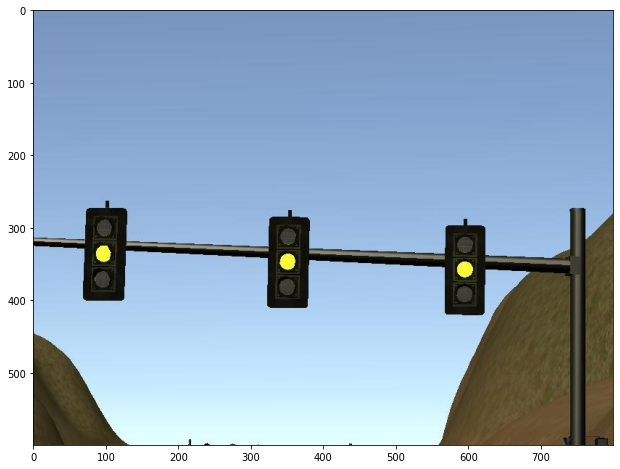

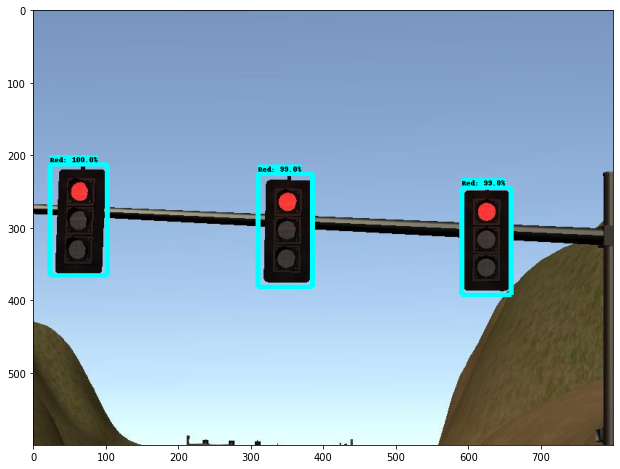

2
Red 0.9960799
Distance (metres) 0.0
Time in milliseconds 23.05150032043457 

2
Red 0.98955774
Distance (metres) 0.0
Time in milliseconds 23.05150032043457 

2
Red 0.9876976
Distance (metres) 0.0
Time in milliseconds 23.05150032043457 



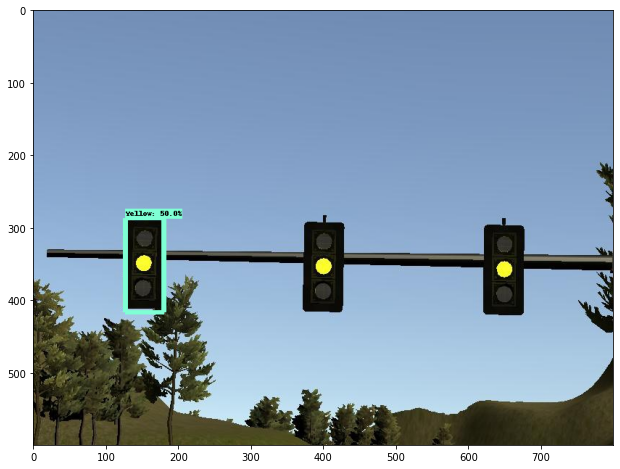

3
Yellow 0.5040694
Distance (metres) 0.0
Time in milliseconds 22.433042526245117 



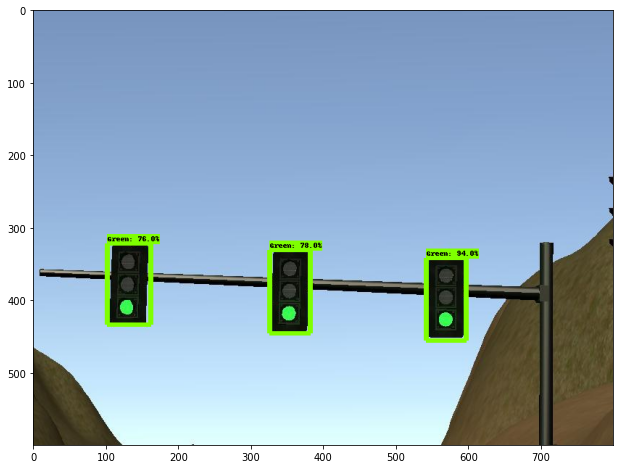

1
Green 0.93850946
Distance (metres) 0.0
Time in milliseconds 22.121667861938477 

1
Green 0.7769443
Distance (metres) 0.0
Time in milliseconds 22.121667861938477 

1
Green 0.76159644
Distance (metres) 0.0
Time in milliseconds 22.121667861938477 



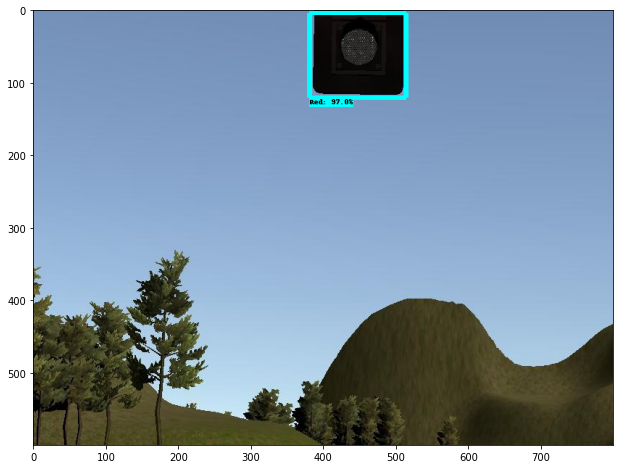

2
Red 0.96629936
Distance (metres) 0.0
Time in milliseconds 24.100065231323242 



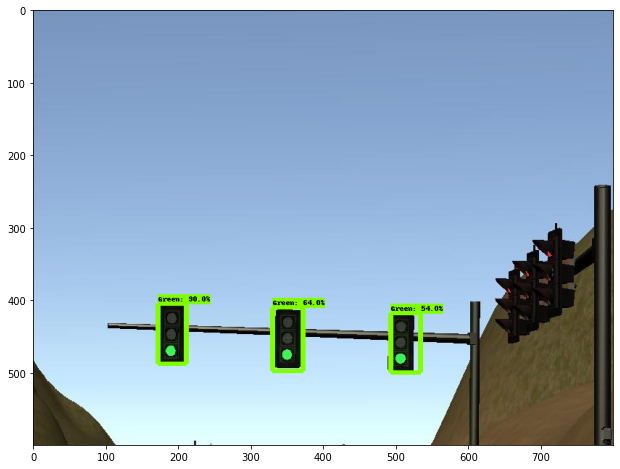

1
Green 0.9028144
Distance (metres) 0.0
Time in milliseconds 22.24254608154297 

1
Green 0.6372682
Distance (metres) 0.0
Time in milliseconds 22.24254608154297 

1
Green 0.54233277
Distance (metres) 0.0
Time in milliseconds 22.24254608154297 



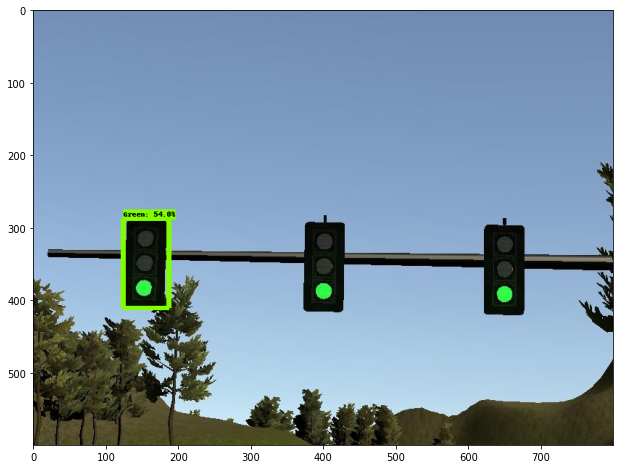

1
Green 0.5395138
Distance (metres) 0.0
Time in milliseconds 22.85146713256836 



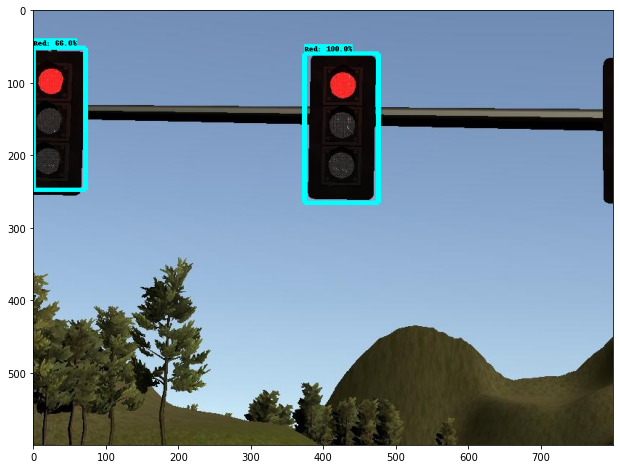

2
Red 0.99975955
Distance (metres) 0.0
Time in milliseconds 23.111820220947266 

2
Red 0.66105485
Distance (metres) 0.0
Time in milliseconds 23.111820220947266 



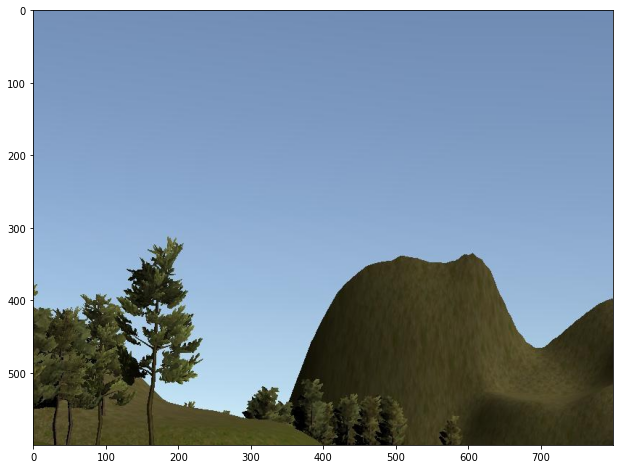

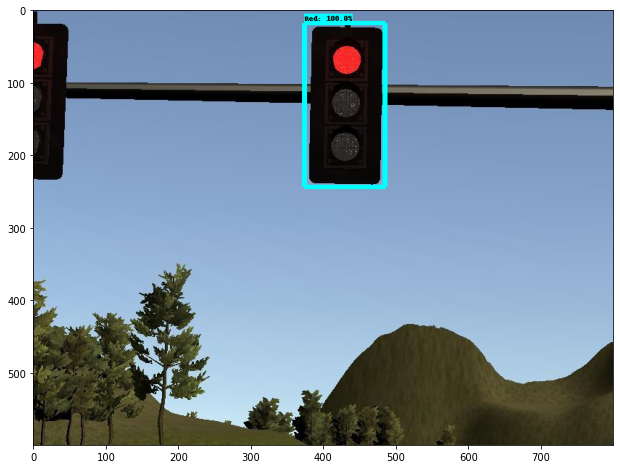

2
Red 0.9983721
Distance (metres) 0.0
Time in milliseconds 25.264263153076172 



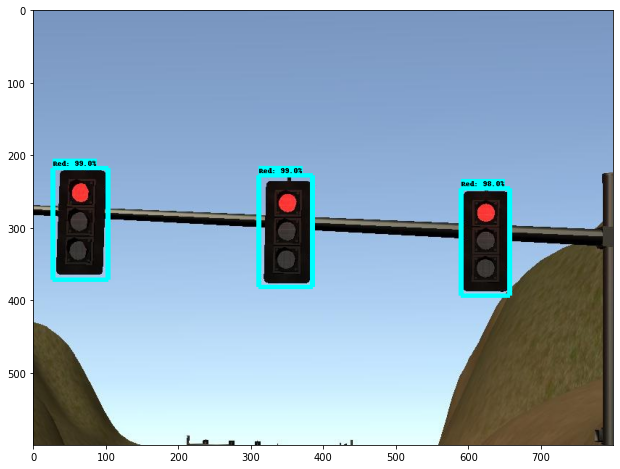

2
Red 0.9949248
Distance (metres) 0.0
Time in milliseconds 22.435665130615234 

2
Red 0.9857832
Distance (metres) 0.0
Time in milliseconds 22.435665130615234 

2
Red 0.9752922
Distance (metres) 0.0
Time in milliseconds 22.435665130615234 



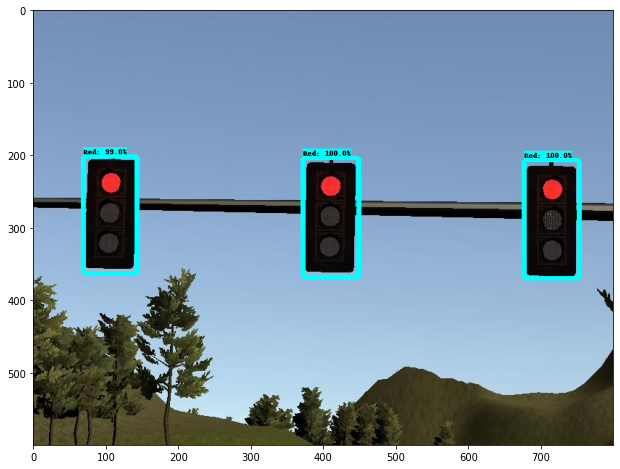

2
Red 0.99942267
Distance (metres) 0.0
Time in milliseconds 23.68307113647461 

2
Red 0.9993931
Distance (metres) 0.0
Time in milliseconds 23.68307113647461 

2
Red 0.994586
Distance (metres) 0.0
Time in milliseconds 23.68307113647461 



In [13]:
detection_graph = import_graph(SIM_MODEL_PATH)
image_paths = load_test_images(SIM_TEST_IMAGE_PATH)
predict(detection_graph, image_paths)